In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import os
print(os.getcwd())

C:\Users\rusla\Desktop\ITMO\7-sem\thesis\rhtr\src\segmentation\visualization


In [3]:
# make project root directory the working directory
os.chdir('C:/Users/rusla/Desktop/ITMO/7-sem/thesis/rhtr')
print(os.getcwd())

C:\Users\rusla\Desktop\ITMO\7-sem\thesis\rhtr


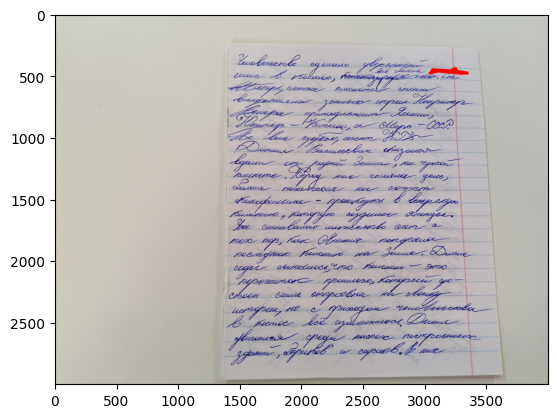

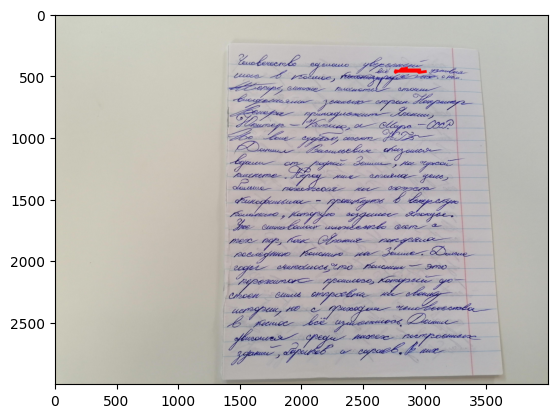

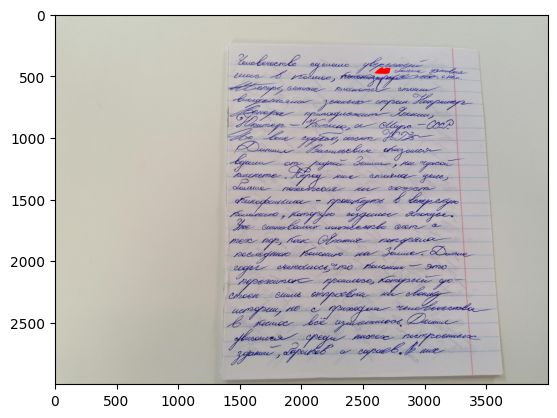

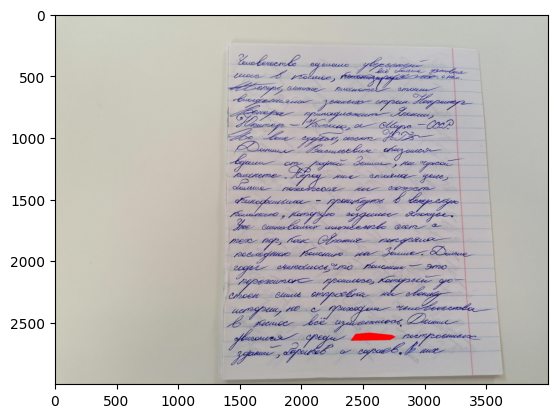

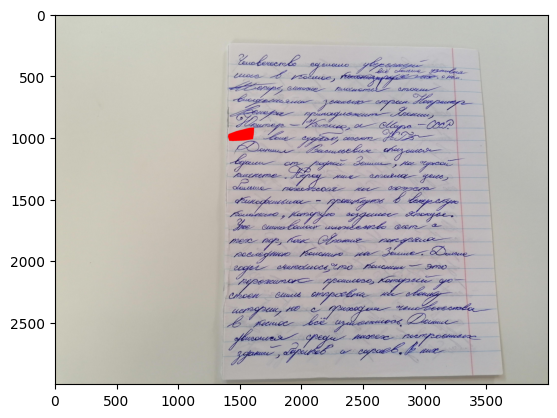

...

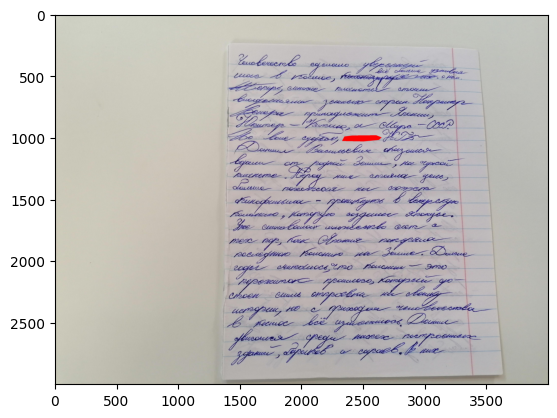

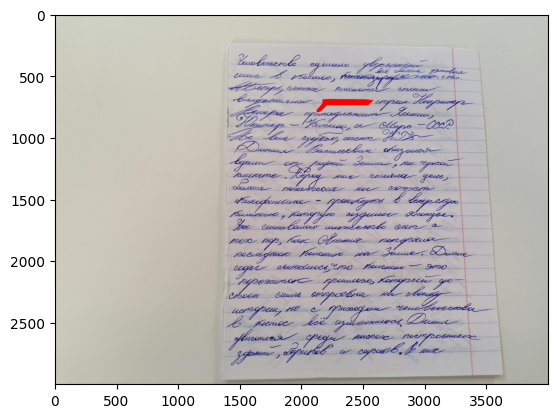

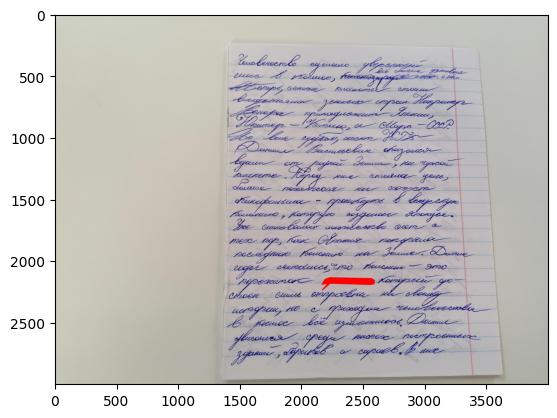

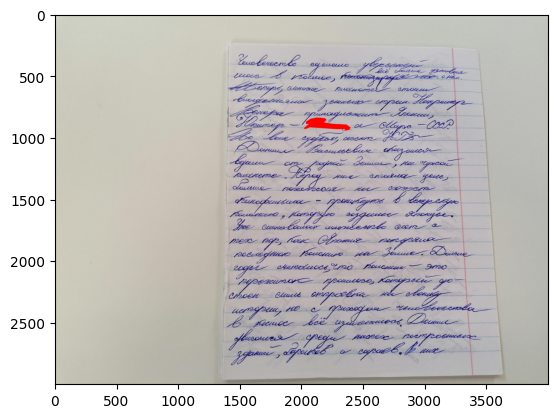

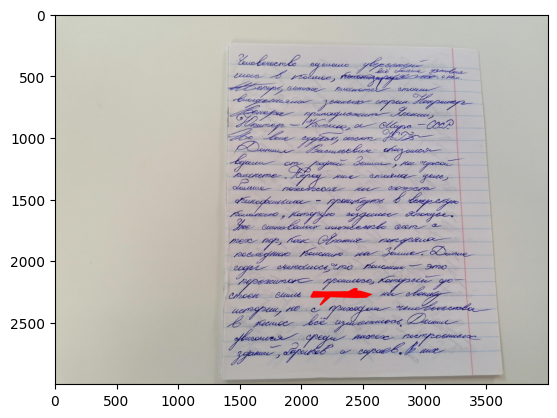

In [32]:
import json 
import cv2
import matplotlib.pyplot as plt
import numpy as np

%matplotlib inline

dataset_filepath = 'data/raw/school_notebooks_RU'

with open(f'{dataset_filepath}/annotations_test.json', 'r') as file:
    annotations = json.load(file)
    
category_id2name = {category['id']: category['name'] for category in annotations['categories']}
image_id2file = {image['id']: image['file_name'] for image in annotations['images']}

for idx, annotation in enumerate(annotations['annotations']):
    if idx > 10: break
    image_file = image_id2file[annotation['image_id']]
    category = category_id2name[annotation['category_id']]
    
    segmentation = annotation['segmentation']
    segmentation = np.array(segmentation).reshape(-1, 2)
    # print(f'{image_file=}, {category=}, {segmentation=}')
    
    # plot image with mask
    image = cv2.imread(f'{dataset_filepath}/images/{image_file}')
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    mask = cv2.fillPoly(image, np.int32([segmentation]), (255, 0, 0))
    # print(f'{image.shape=}, {mask.shape=}')
    plt.imshow(mask)
    plt.show()

image_path='data/raw/school_notebooks_RU/images_processed\\0_0.jpg' target_path='data/raw/school_notebooks_RU/targets\\0_0.npy'
layers count: 3


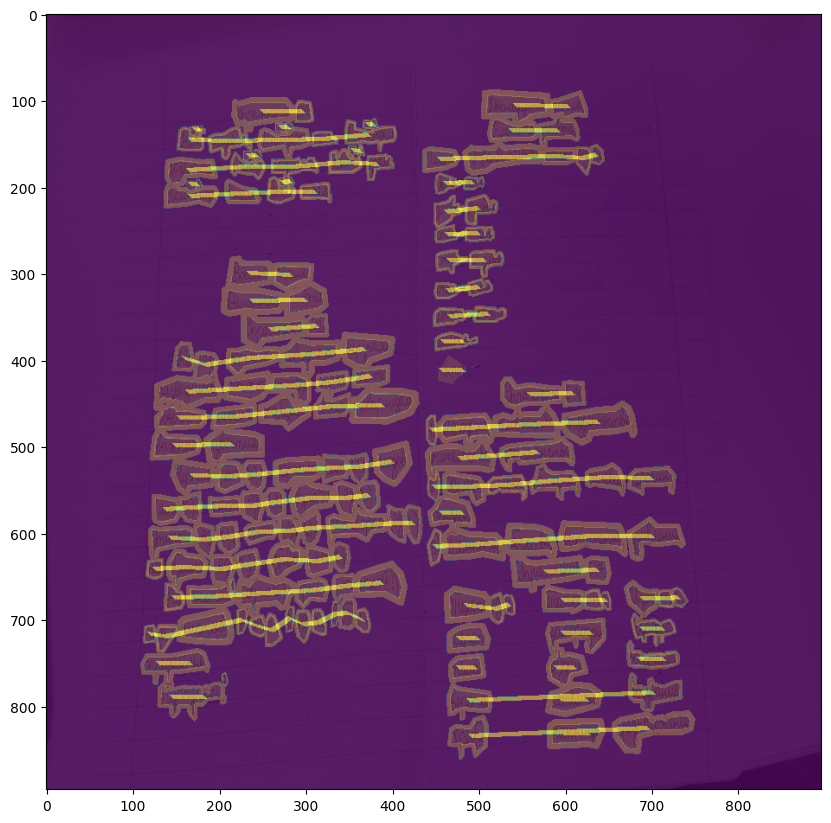

image_path='data/raw/school_notebooks_RU/images_processed\\0_1.jpg' target_path='data/raw/school_notebooks_RU/targets\\0_1.npy'
layers count: 3


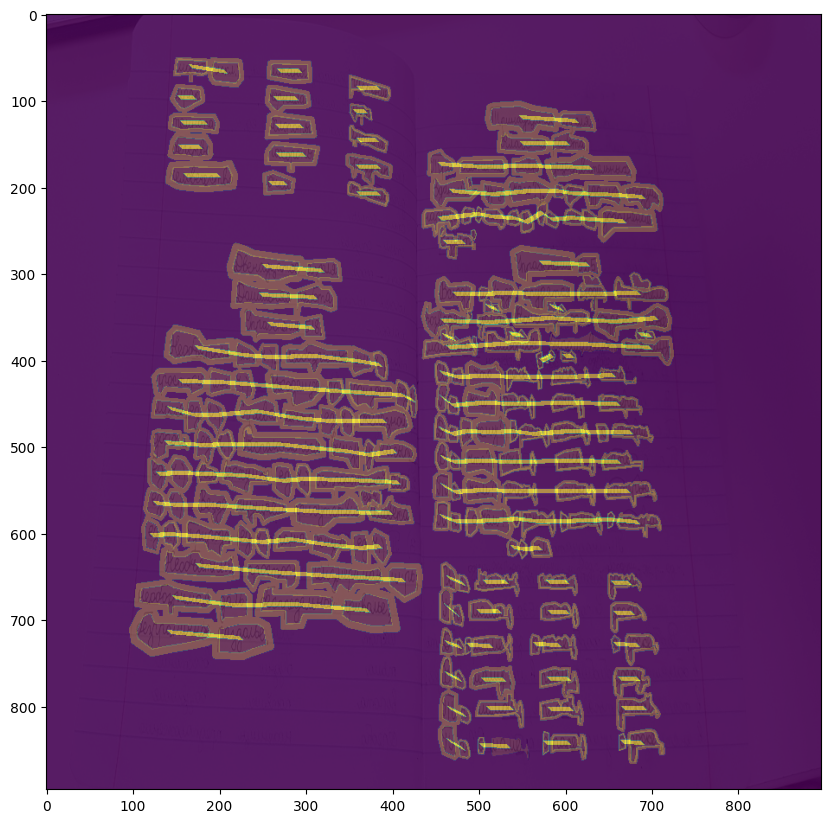

image_path='data/raw/school_notebooks_RU/images_processed\\0_2.jpg' target_path='data/raw/school_notebooks_RU/targets\\0_2.npy'
layers count: 3


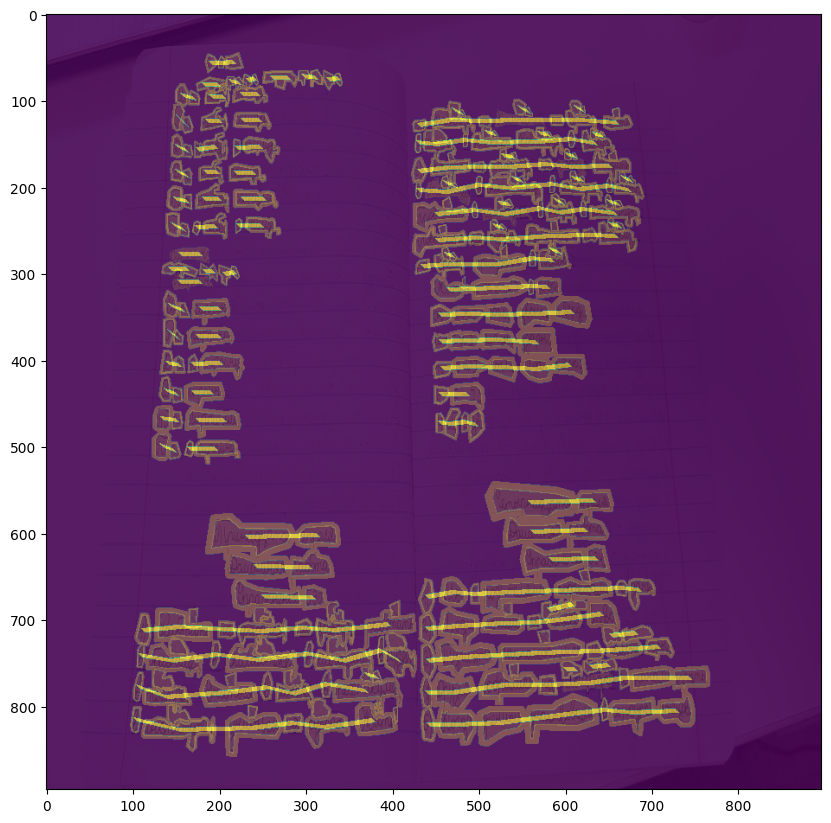

image_path='data/raw/school_notebooks_RU/images_processed\\0_3.jpg' target_path='data/raw/school_notebooks_RU/targets\\0_3.npy'
layers count: 3


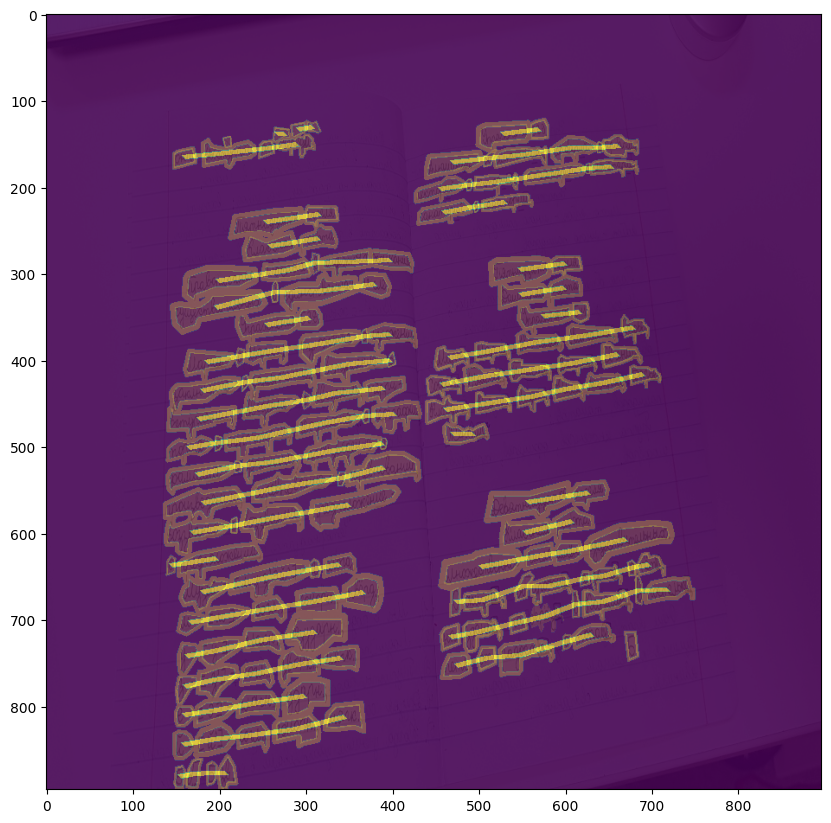

image_path='data/raw/school_notebooks_RU/images_processed\\0_4.jpg' target_path='data/raw/school_notebooks_RU/targets\\0_4.npy'
layers count: 3


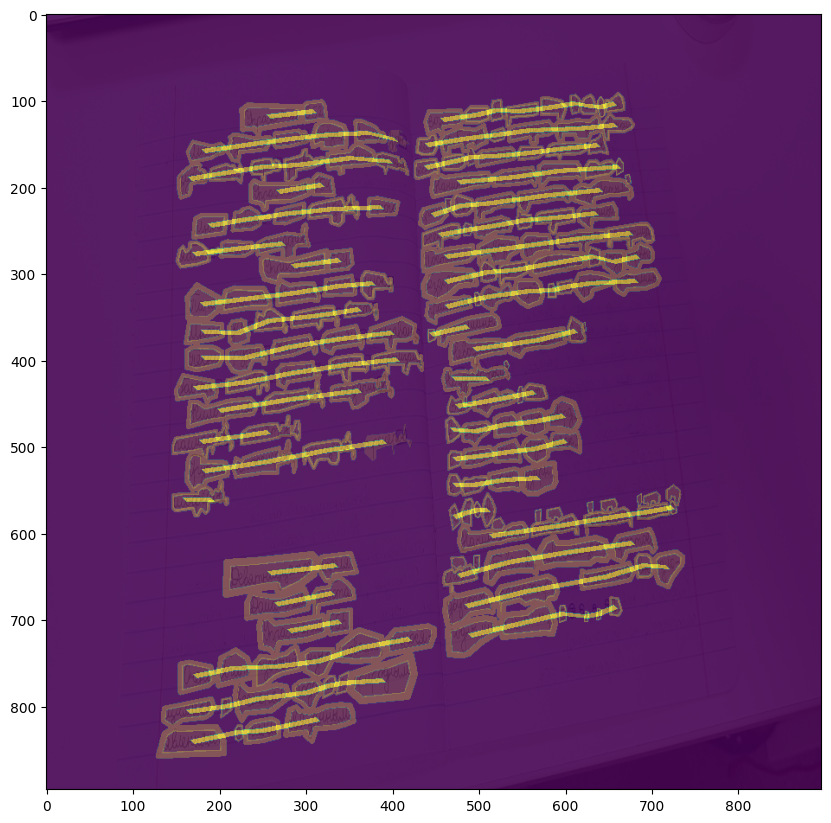

image_path='data/raw/school_notebooks_RU/images_processed\\0_5.jpg' target_path='data/raw/school_notebooks_RU/targets\\0_5.npy'
layers count: 3


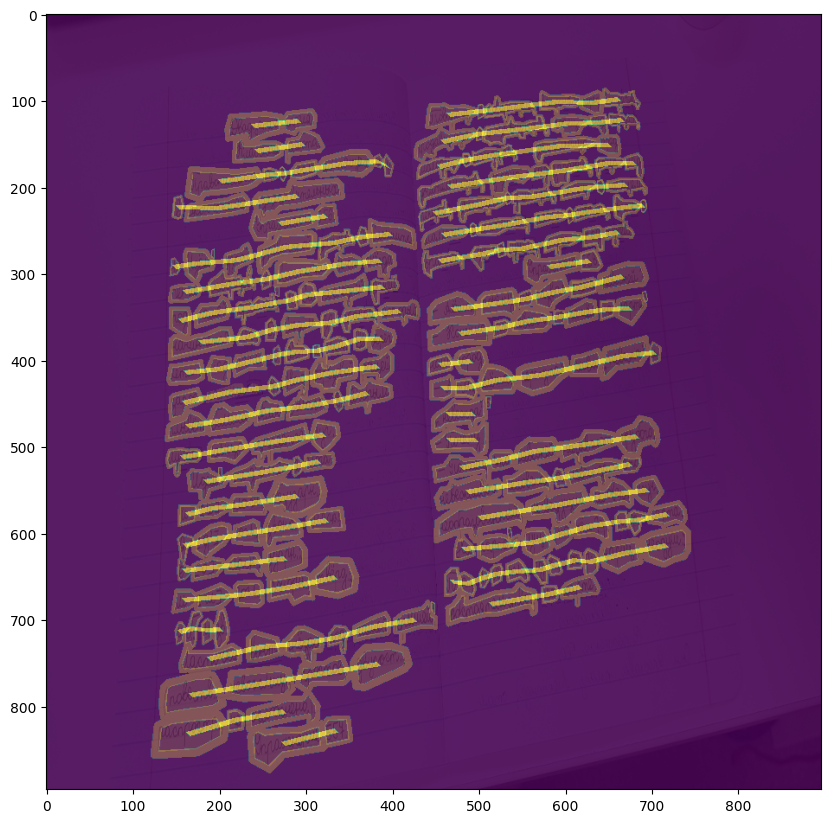

image_path='data/raw/school_notebooks_RU/images_processed\\0_6.jpg' target_path='data/raw/school_notebooks_RU/targets\\0_6.npy'
layers count: 3


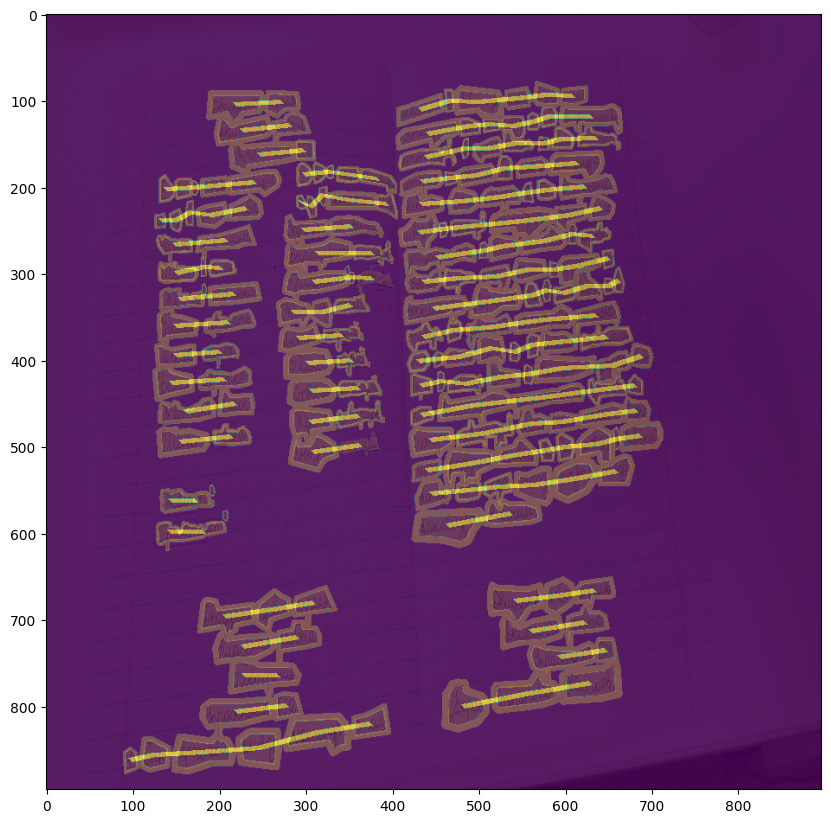

image_path='data/raw/school_notebooks_RU/images_processed\\0_7.jpg' target_path='data/raw/school_notebooks_RU/targets\\0_7.npy'
layers count: 3


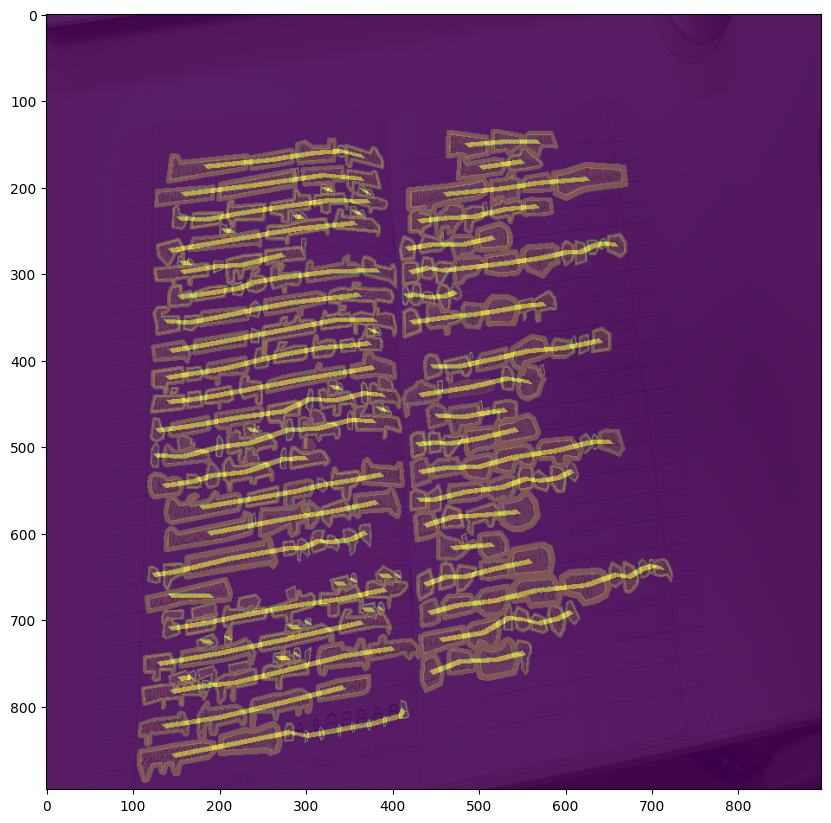

image_path='data/raw/school_notebooks_RU/images_processed\\0_8.jpg' target_path='data/raw/school_notebooks_RU/targets\\0_8.npy'
layers count: 3


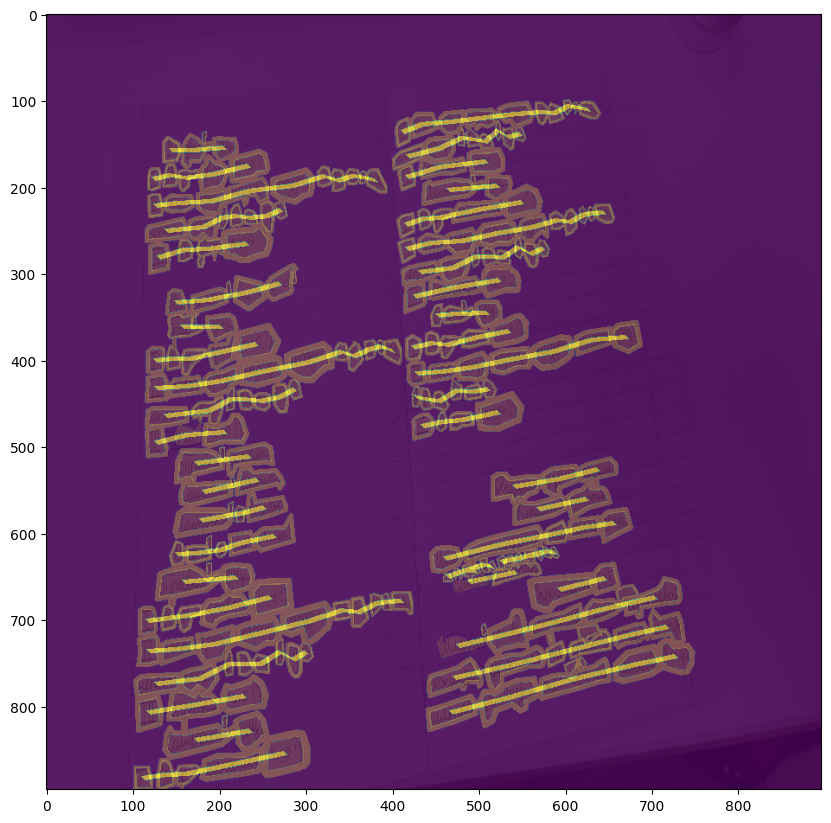

image_path='data/raw/school_notebooks_RU/images_processed\\100_1000.JPG' target_path='data/raw/school_notebooks_RU/targets\\100_1000.npy'
layers count: 3


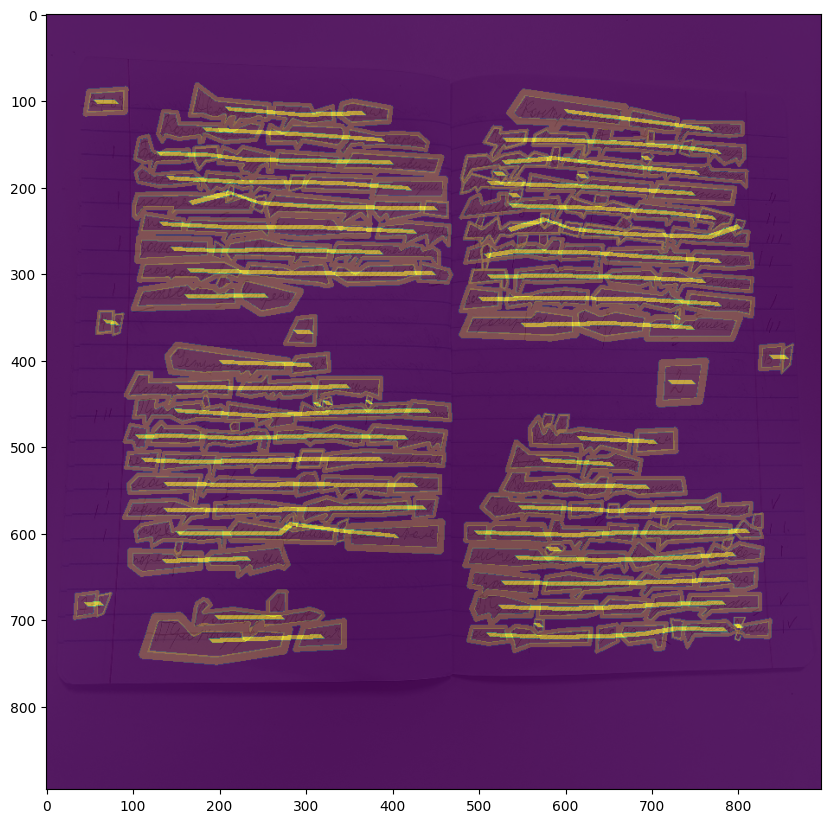

image_path='data/raw/school_notebooks_RU/images_processed\\100_1001.JPG' target_path='data/raw/school_notebooks_RU/targets\\100_1001.npy'
layers count: 3


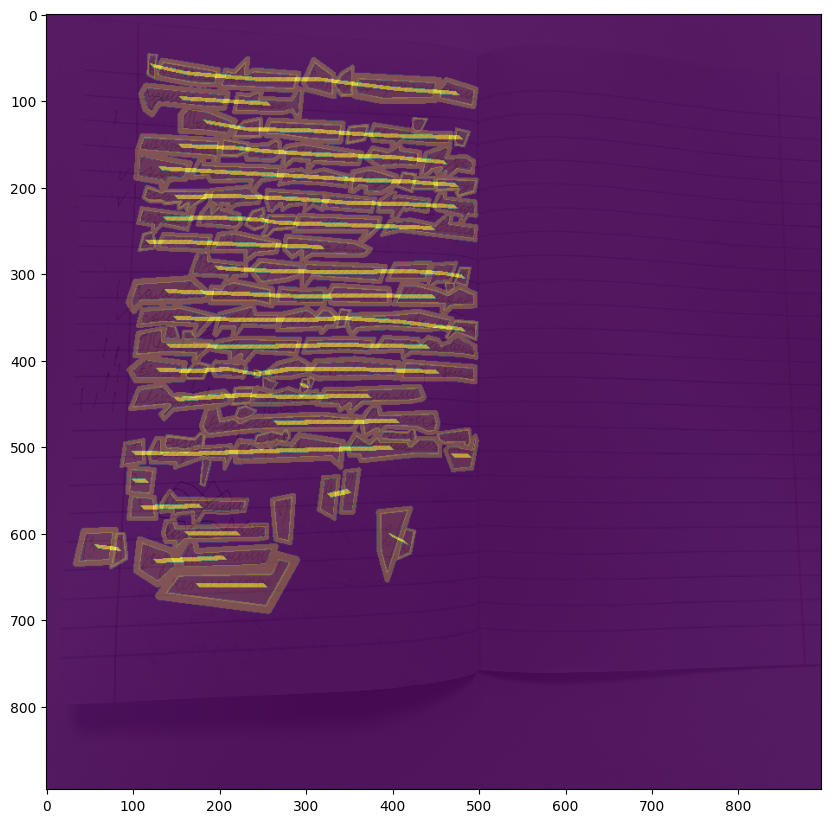

In [25]:
# iterate over 'data/raw/magazine/annotations_val.csv' less than 10 times
# plot image and corresponding mask target on the same plot for verification
import matplotlib.pyplot as plt
import pandas as pd
import cv2
import numpy as np

dataset_filepath = 'data/raw/school_notebooks_RU'
annotations = pd.read_csv(f'{dataset_filepath}/annotations_train.csv')

for i in range(len(annotations)):
    row = annotations.iloc[i]
    
    image_path = f"{dataset_filepath}/{row['image']}"
    target_path = f"{dataset_filepath}/{row['target']}"
    
    print(f'{image_path=} {target_path=}')
    
    img = cv2.imread(image_path)
    if img is None: print('img is none')
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    
    mask = np.load(target_path)
    if np.max(mask) == 0: continue
    
    plt.figure(figsize=(10, 20))
    plt.imshow(img)
    
    # iterate over mask layers and plot them on the same plot
    print('layers count:', mask.shape[2])
    
    for j in range(mask.shape[2]):
        plt.imshow(mask[:, :, j], alpha=0.5)
        
    plt.show()